In [1]:
%load_ext autoreload
%autoreload 2

In [3]:
### v9: multi-task training

import matplotlib.pyplot as plt
import numpy as np
import quaternions as Q
import torch
import torch.utils.data
import tqdm
import transformers
from demo_to_state_action_pairs import create_torch_dataset_v3
from get_data import generate_demos
from model_architectures import VisualPlanDiffuserV7
from visualization import visualize_2d_score_prediction
import pickle
import transformers
import grid_sampling
import inference
import visualization
from demo_to_state_action_pairs import create_labels_v3, CAMERAS as camera_names
import grid_sampling
from test_v9 import train

# demos = generate_demos("close_jar", 10)

# with open("replay_buffer/close_jar_10.pkl", "wb") as f:
#     pickle.dump(demos, f)

with open("replay_buffer/close_jar_10.pkl", "rb") as f:
    demos = pickle.load(f)

# train(demos[:1], epochs=5)

Loading checkpoints.
Loaded checkpoints.


In [6]:
print("Loading checkpoints.")
device = torch.device("cuda")
clip = transformers.CLIPVisionModel.from_pretrained("openai/clip-vit-base-patch16")
model = VisualPlanDiffuserV7(clip).to(device)
# model.load_state_dict(torch.load("diffusion_model.pt"))
print("Loaded checkpoints.")

Loading checkpoints.
Loaded checkpoints.


Freezing first 0 layers out of 12


100%|██████████| 2/2 [00:00<00:00,  3.80it/s, loss=0.0915, quat_loss=0.000751, score_loss=0.084]


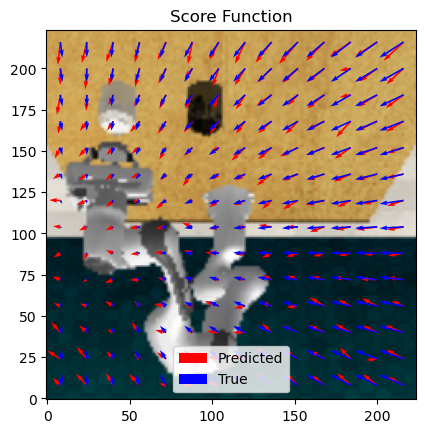

In [10]:
train(demos[:1], epochs=5, model=model)

In [36]:
clip_processor = transformers.CLIPProcessor.from_pretrained("openai/clip-vit-base-patch16")

grid_size = 14
image_size = 224
with torch.no_grad():
    pixel_values = clip_processor(images=images[0], return_tensors="pt").pixel_values.cuda()
    pred = model(pixel_values).view(-1, grid_size, grid_size, 6).permute(0, 2, 1, 3)
    pred_direction = pred[..., 0:2].contiguous()
    pred_quat = pred[..., 2:6].contiguous()

    pred_direction_px = pred_direction * (image_size / 2)


Sampling keypoint.
Finished sampling keypoint.
torch.Size([14, 14, 2])
torch.Size([14, 14, 2])


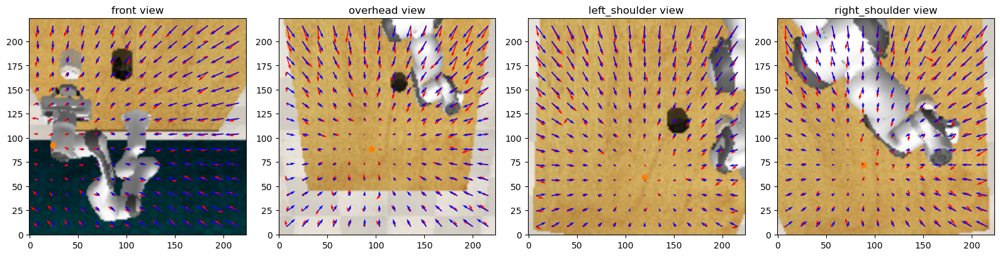

In [39]:
demo = demos[0]
tuples = create_labels_v3(demo)
(images, target_locations_2d, quaternions, info) = tuples[4]
extrinsics = info['extrinsics']
intrinsics = info['intrinsics']
target_locations_2d = torch.tensor(target_locations_2d, device=device)

print("Sampling keypoint.")
(history_3d, history_quaternions, history_2d_projections, predicted_score_maps, quat_maps) = \
    inference.sample_keypoint(model, images, extrinsics, intrinsics, (0.5, 0.5, 1.0))
print("Finished sampling keypoint.")

batch_size = len(images)
token_coordinates = grid_sampling.calculate_token_coordinates(224, 14, device=device)
token_coordinates_ = token_coordinates.unsqueeze(0).expand(batch_size, -1, -1, -1)
true_score_maps = target_locations_2d.view(batch_size, 1, 1, 2) - token_coordinates_

# plt.clf()
# plt.title("Score Function")
# visualization.visualize_2d_score_prediction(
#     images[0],
#     token_coordinates_[0].contiguous().view(-1, 2),
#     pred_direction_px[0].view(-1, 2),
#     true_score_maps[0].view(-1, 2),
# )
# plt.legend()

plt.figure(figsize=(16, 4))

visualization.visualize_2d_sampling_trajectory(
    images,
    token_coordinates,
    predicted_score_maps,
    true_score_maps,
    history_2d_projections,
    target_locations_2d,
    camera_names)

plt.tight_layout()
plt.show()


In [44]:
import matplotlib.pyplot as plt
import numpy as np
import quaternions as Q
import torch
import torch.utils.data
import tqdm
import transformers
from demo_to_state_action_pairs import create_torch_dataset_v3
from get_data import generate_demos
from model_architectures import VisualPlanDiffuserV7
from visualization import visualize_2d_score_prediction
import pickle
import transformers
import grid_sampling
import inference
import visualization
from demo_to_state_action_pairs import create_labels_v3, CAMERAS as camera_names
import grid_sampling

def freeze_clip_layers(clip, first_n=0):
    for i in range(first_n):
        clip.vision_model.encoder.layers[i].requires_grad_(False)
    print(f"Freezing first {first_n} layers out of {len(clip.vision_model.encoder.layers)}")
    
def annihilate_mlp_parameters(model):
    for name, param in model.named_parameters():
        # check if MLP
        if "linear" in name and ('.weight' in name or '.bias' in name):
            param.data.fill_(0)

def train(demos, epochs=10):
    device = torch.device('cuda')

    clip = transformers.CLIPVisionModel.from_pretrained("openai/clip-vit-base-patch16").to(device) # type: ignore
    clip_processor = transformers.CLIPProcessor.from_pretrained("openai/clip-vit-base-patch16") # type: ignore
    model = VisualPlanDiffuserV7(clip).to(device)

    freeze_clip_layers(clip, first_n=0)
    # annihilate_mlp_parameters(model)

    optim = torch.optim.Adam([p for p in model.parameters() if p.requires_grad], lr=1e-5)

    # Generates (image, position, quaternion) triplets
    dataset = create_torch_dataset_v3(demos, device=device)
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=16, shuffle=False)
    
    # We predict the direction of the keypoint from *these* pixel locations.
    # These are the 2D coordinates of each token, in pixel space.
    image_size = 224
    grid_size = 14
    token_coordinates = grid_sampling.calculate_token_coordinates(image_size, grid_size, device=device)

    for epoch in range(epochs):
        for (image, position, quat) in (pbar := tqdm.tqdm(dataloader)):
            pixel_values = clip_processor(images=image, return_tensors="pt", do_rescale=False).to(device=device).pixel_values # type: ignore
            
            # Unsqueeze for this particular batch
            token_coordinates_ = token_coordinates.unsqueeze(0).expand(position.shape[0], -1, -1, -1)
            position_ = position.view(-1, 1, 1, 2)

            true_direction = (position_ - token_coordinates_)
            true_direction_scaled = true_direction / (image_size / 2)
            
            # (batch, token_y, token_x, 2) -> (batch, token_x, token_y, 2)
            pred = model(pixel_values).view(-1, grid_size, grid_size, 6).permute(0, 2, 1, 3)
            pred_direction = pred[..., 0:2].contiguous()
            pred_quat = pred[..., 2:6].contiguous()
            
            pred_direction_px = pred_direction * (image_size / 2)

            score_loss = (pred_direction - true_direction_scaled).pow(2).mean()
            
            # Weighted average based on distance to keypoint.
            distances = (token_coordinates_ - position_).norm(dim=-1, keepdim=True)
            quat_loss_weighting = torch.exp(-distances / 0.1)
            quat_loss_weighting = quat_loss_weighting / quat_loss_weighting.sum(dim=(1, 2, 3), keepdim=True)
            quat = quat.view(-1, 1, 1, 4)
            quat_loss = ((pred_quat - quat).pow(2) * quat_loss_weighting).mean()

            quat_loss_coeff = 10
            loss = score_loss + quat_loss_coeff * quat_loss

            optim.zero_grad()
            loss.backward()
            optim.step()
            
            pbar.set_postfix({"loss": loss.item(), "quat_loss": quat_loss.item(), "score_loss": score_loss.item()})
        
        tuples = create_labels_v3(demo)
        (images, target_locations_2d, quaternions, info) = tuples[4]
        extrinsics = info['extrinsics']
        intrinsics = info['intrinsics']
        target_locations_2d = torch.tensor(target_locations_2d, device=device)

        print("Sampling keypoint.")
        (history_3d, history_quaternions, history_2d_projections, predicted_score_maps, quat_maps) = \
            inference.sample_keypoint(model, images, extrinsics, intrinsics, (0.5, 0.5, 1.0))
        print("Finished sampling keypoint.")

        batch_size = len(images)
        # token_coordinates = grid_sampling.calculate_token_coordinates(image_size=224, grid_size=14, device=device)
        # true_score_maps = target_locations_2d.view(batch_size, 1, 1, 2) - token_coordinates.view(1, 14, 14, 2).expand(batch_size, -1, -1, -1)
        
        pixel_values = clip_processor(images=image, return_tensors="pt", do_rescale=False).to(device=device).pixel_values
        pred = model(pixel_values).view(-1, grid_size, grid_size, 6).permute(0, 2, 1, 3)
        pred_direction = pred[..., 0:2].contiguous()
        pred_quat = pred[..., 2:6].contiguous()

        plt.figure(figsize=(16, 4))
        visualization.visualize_2d_sampling_trajectory(
            images,
            token_coordinates,
            predicted_score_maps,
            true_score_maps,
            history_2d_projections,
            target_locations_2d,
            camera_names)
        plt.tight_layout()
        plt.show()

        # Visualize the vector field
        plt.clf()
        plt.title("Score Function 0")
        visualize_2d_score_prediction(
            image[0],
            token_coordinates.view(-1, 2),
            (pred_direction[0] * 224/2).view(-1, 2),
            true_direction[0].view(-1, 2),
        )
        plt.legend()
        plt.show()
        
        # Visualize the vector field
        plt.clf()
        plt.title("Score Function")
        visualize_2d_score_prediction(
            image[0],
            token_coordinates.view(-1, 2),
            pred_direction_px[0].view(-1, 2),
            true_direction[0].view(-1, 2),
        )
        plt.legend()
        plt.show()


Freezing first 0 layers out of 12


100%|██████████| 2/2 [00:00<00:00,  3.70it/s, loss=0.504, quat_loss=0.00139, score_loss=0.49] 


Sampling keypoint.
Finished sampling keypoint.


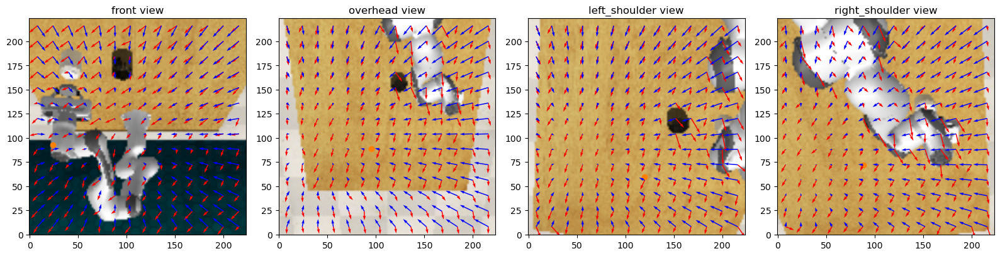

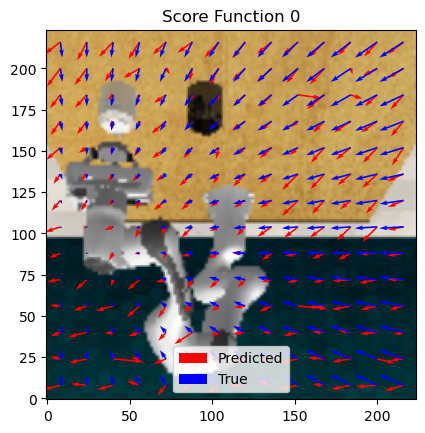

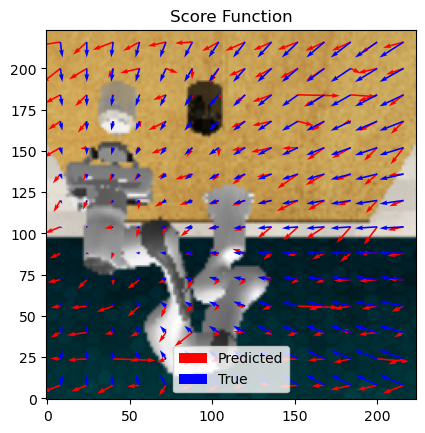

100%|██████████| 2/2 [00:00<00:00,  3.76it/s, loss=0.283, quat_loss=0.00117, score_loss=0.271]


Sampling keypoint.
Finished sampling keypoint.


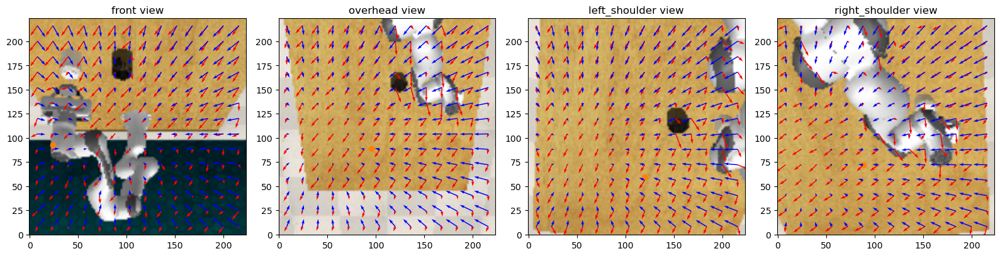

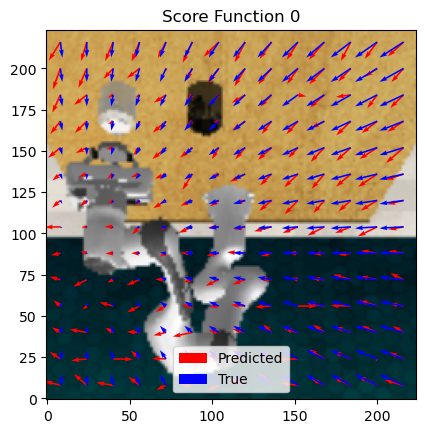

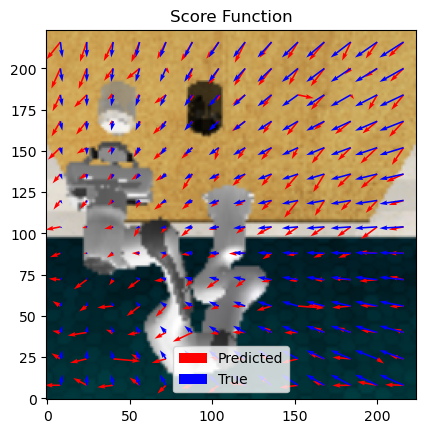

100%|██████████| 2/2 [00:00<00:00,  3.99it/s, loss=0.19, quat_loss=0.00104, score_loss=0.18] 


Sampling keypoint.
Finished sampling keypoint.


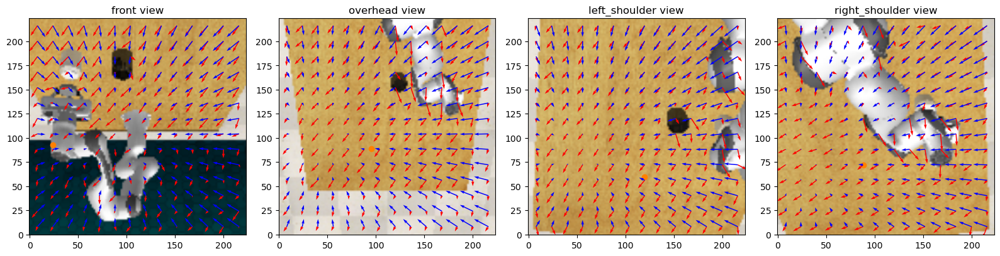

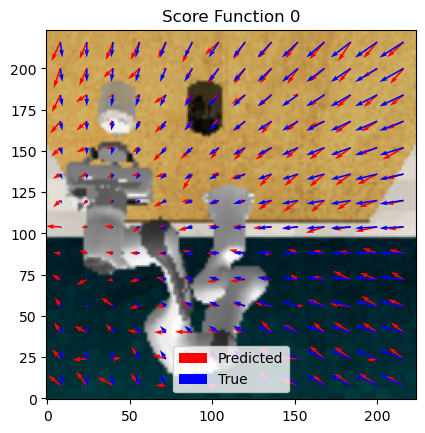

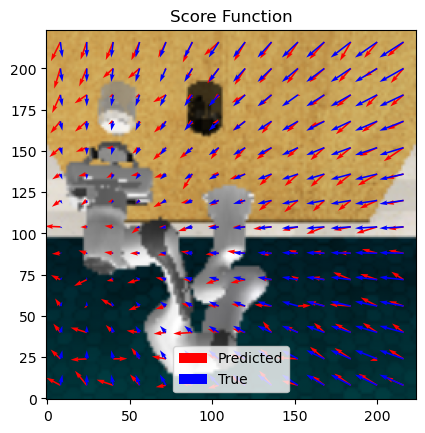

100%|██████████| 2/2 [00:00<00:00,  3.98it/s, loss=0.127, quat_loss=0.000858, score_loss=0.118]


Sampling keypoint.
Finished sampling keypoint.


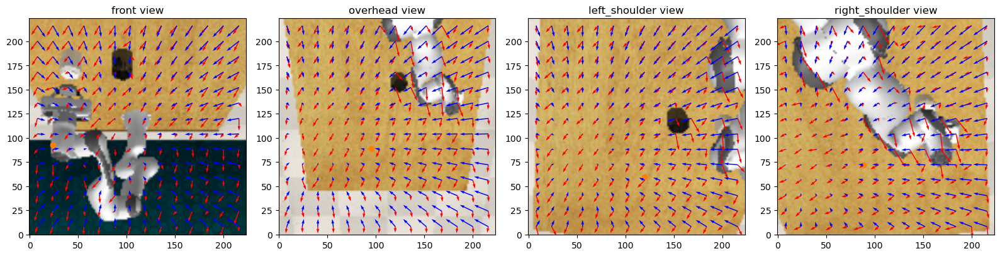

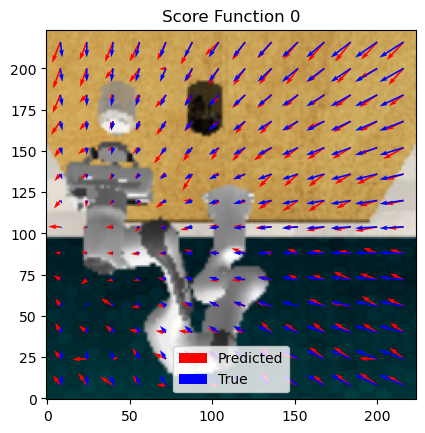

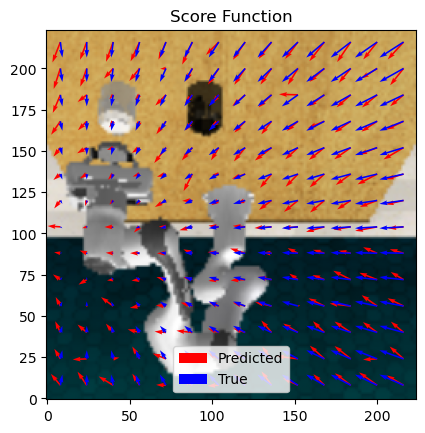

100%|██████████| 2/2 [00:00<00:00,  3.87it/s, loss=0.0803, quat_loss=0.000773, score_loss=0.0726]


Sampling keypoint.
Finished sampling keypoint.


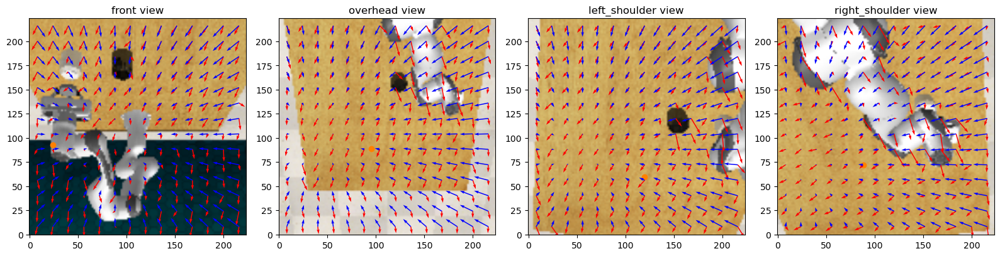

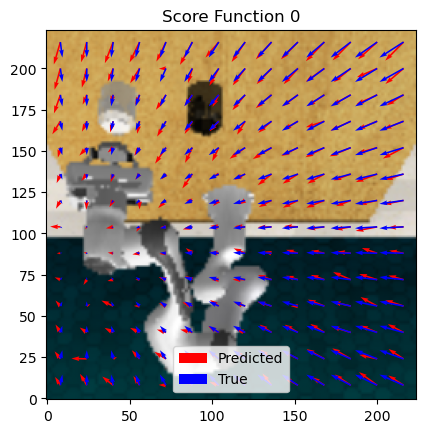

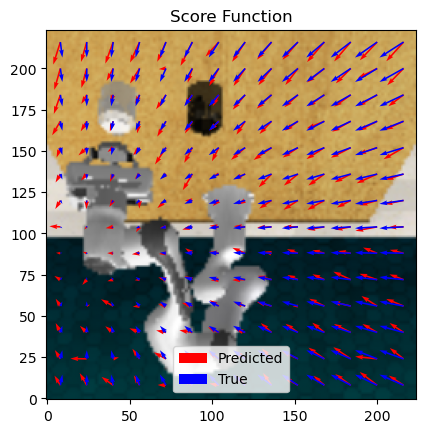

100%|██████████| 2/2 [00:00<00:00,  4.00it/s, loss=0.0568, quat_loss=0.000711, score_loss=0.0497]


Sampling keypoint.
Finished sampling keypoint.


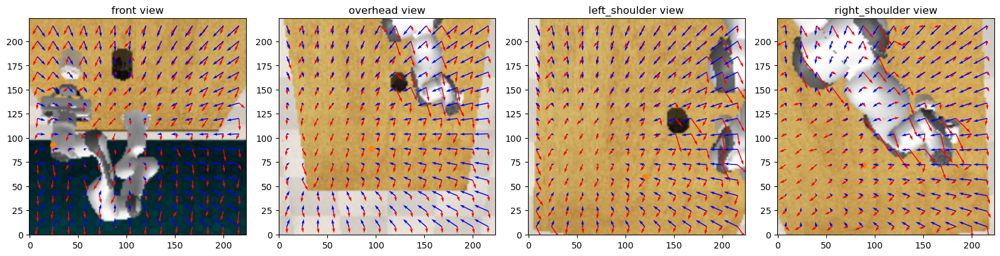

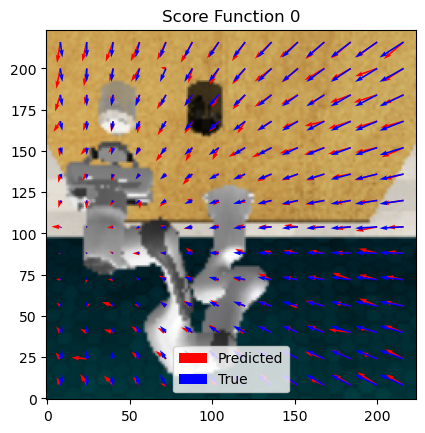

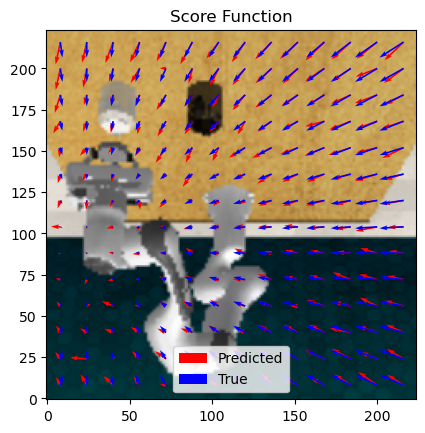

100%|██████████| 2/2 [00:00<00:00,  3.12it/s, loss=0.0426, quat_loss=0.000647, score_loss=0.0361]


Sampling keypoint.
Finished sampling keypoint.


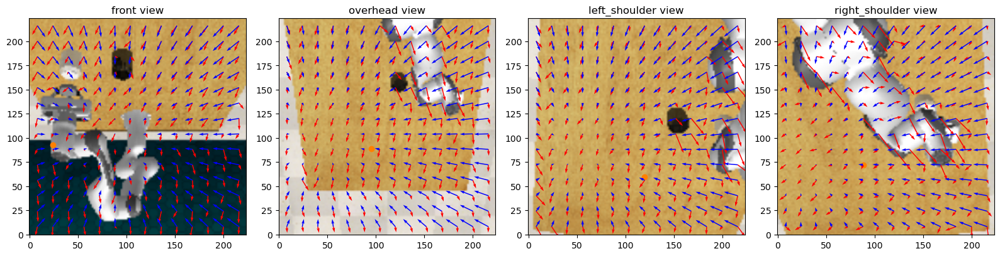

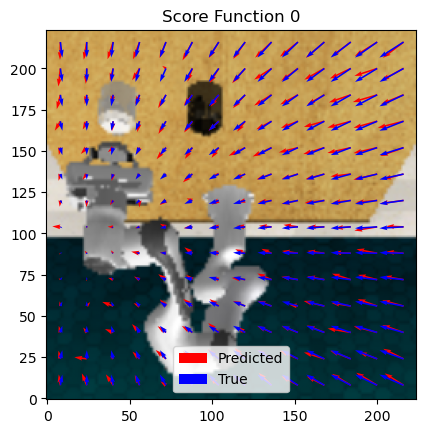

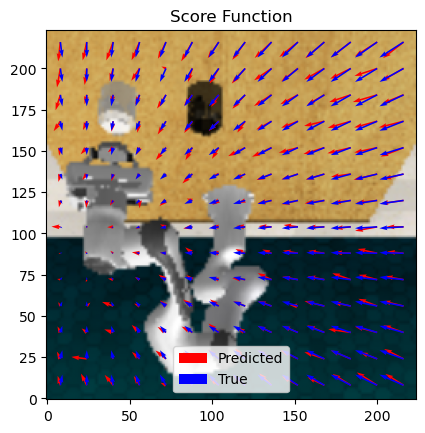

100%|██████████| 2/2 [00:00<00:00,  3.99it/s, loss=0.0337, quat_loss=0.000613, score_loss=0.0276]


Sampling keypoint.
Finished sampling keypoint.


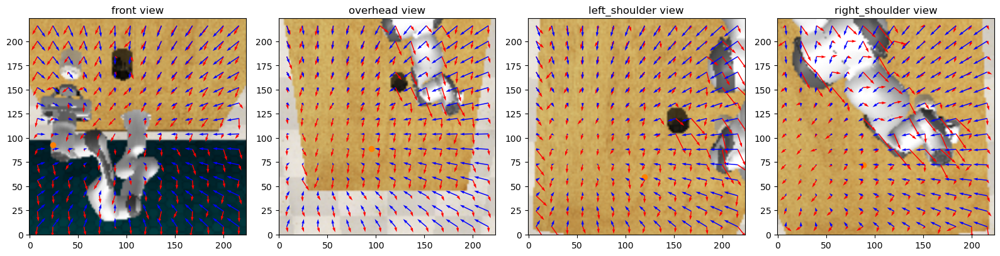

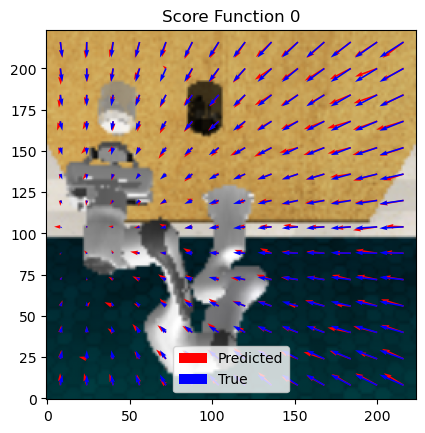

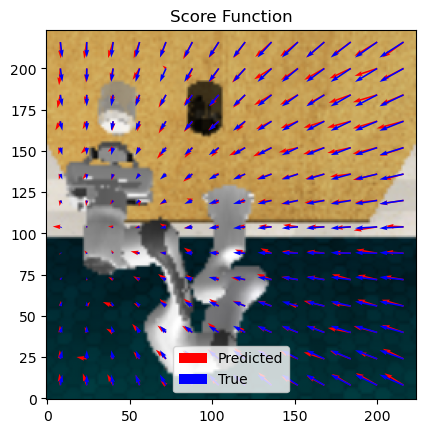

100%|██████████| 2/2 [00:00<00:00,  3.84it/s, loss=0.0264, quat_loss=0.000563, score_loss=0.0207]


Sampling keypoint.
Finished sampling keypoint.


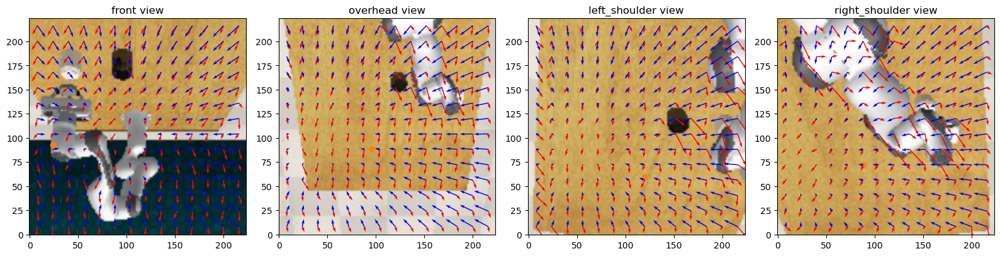

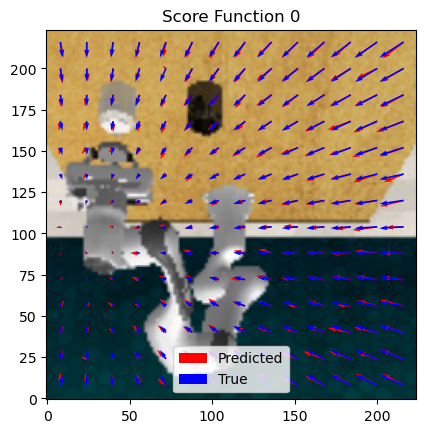

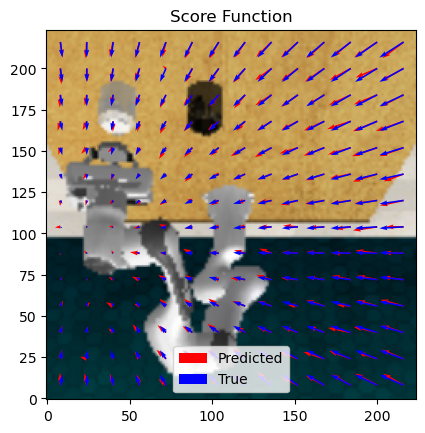

100%|██████████| 2/2 [00:00<00:00,  3.82it/s, loss=0.0226, quat_loss=0.000517, score_loss=0.0174]


Sampling keypoint.
Finished sampling keypoint.


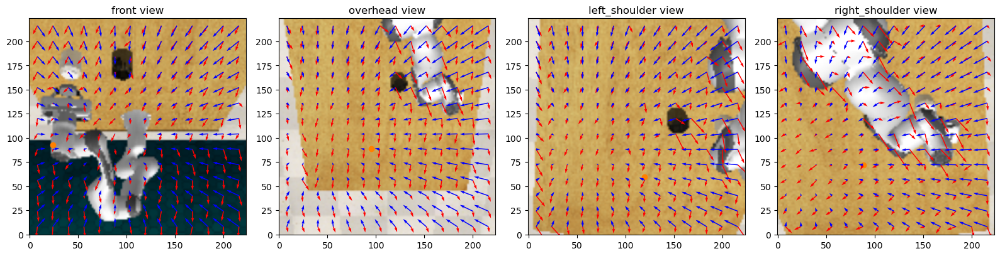

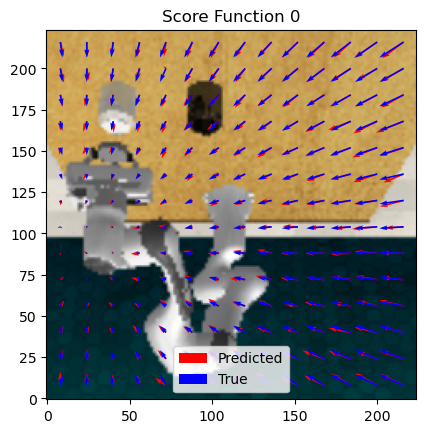

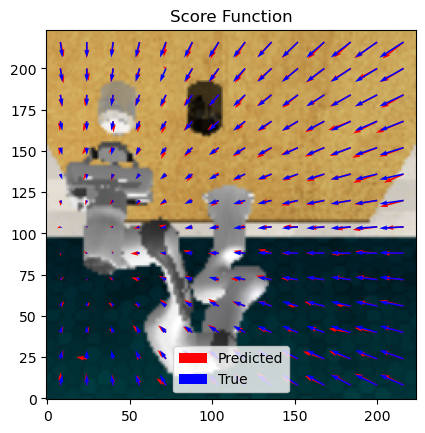

In [45]:
train(demos[:1], epochs=10)